# Image fitting

After implementing all requested source code, you will fit an MLP and a SIREN to the same image.

These models train fairly fast on a CPU (~2 minutes on a M1 MacBook Pro), but feel free to train on a GPU or Colab for faster prototyping!

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import matplotlib.pyplot as plt
import torch

from problem_1_train import train
from utils import ImageDataset

In [4]:
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")

## Experiment 1: MLPs vs SIRENs

First, fit the MLP.

Step 1/2000: Loss = 0.33320951, PSNR = 4.7728


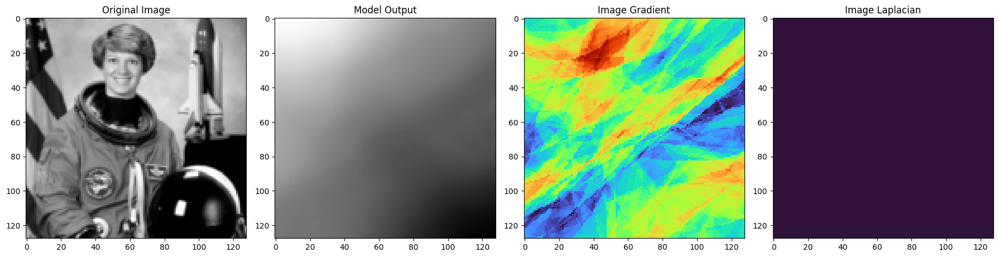

Step 100/2000: Loss = 0.23029664, PSNR = 6.3771


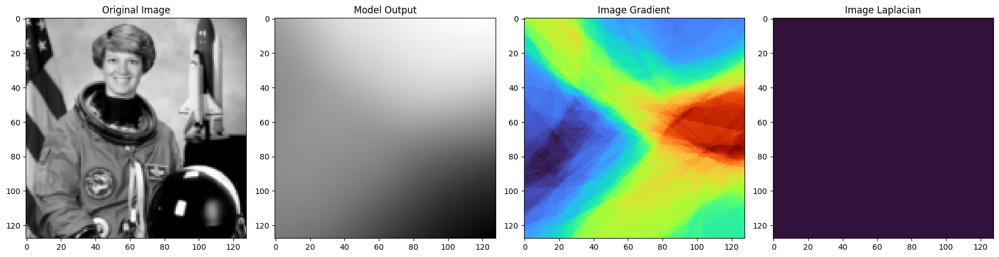

Step 200/2000: Loss = 0.21354897, PSNR = 6.7050


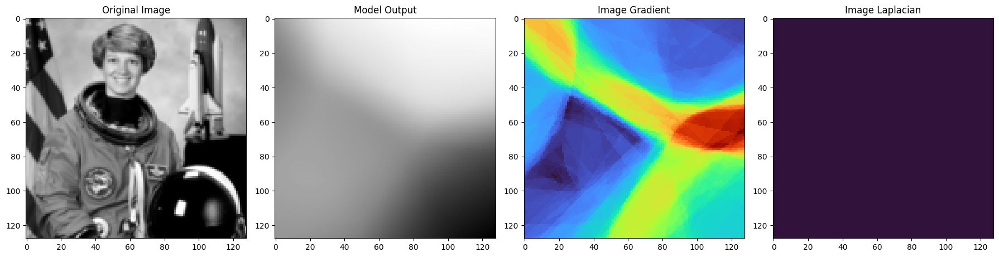

Step 300/2000: Loss = 0.19960786, PSNR = 6.9982


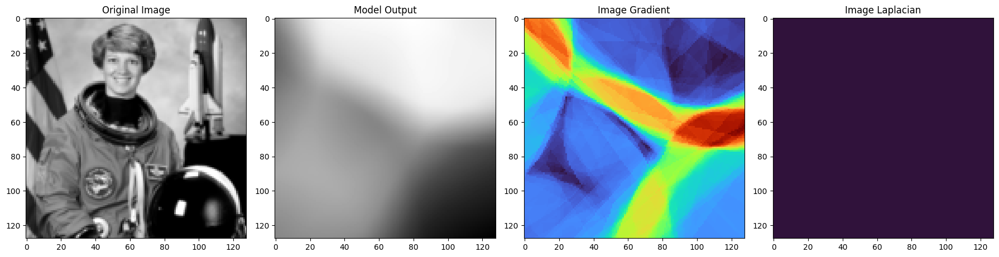

Step 400/2000: Loss = 0.18356700, PSNR = 7.3621


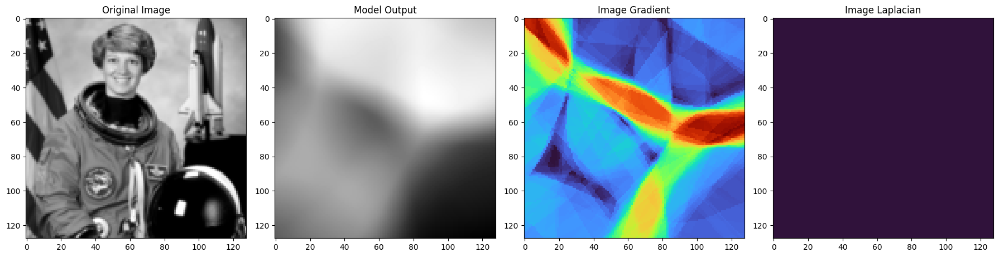

Step 500/2000: Loss = 0.16837411, PSNR = 7.7372


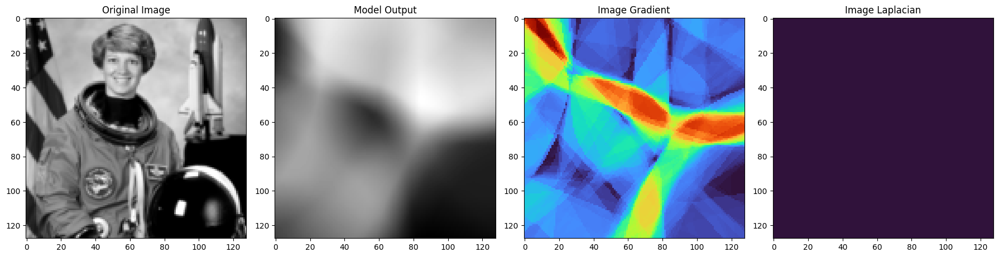

Step 600/2000: Loss = 0.15577897, PSNR = 8.0749


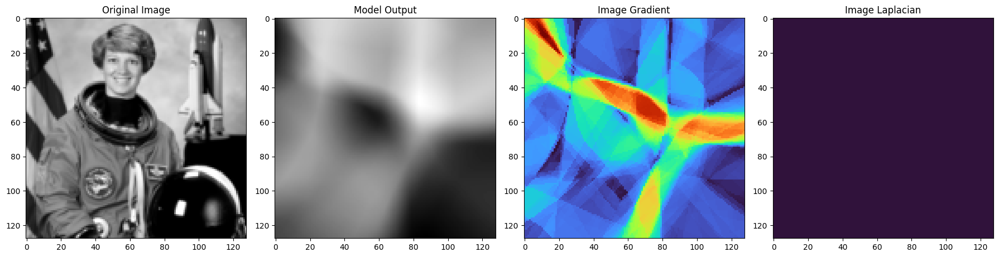

Step 700/2000: Loss = 0.14566663, PSNR = 8.3664


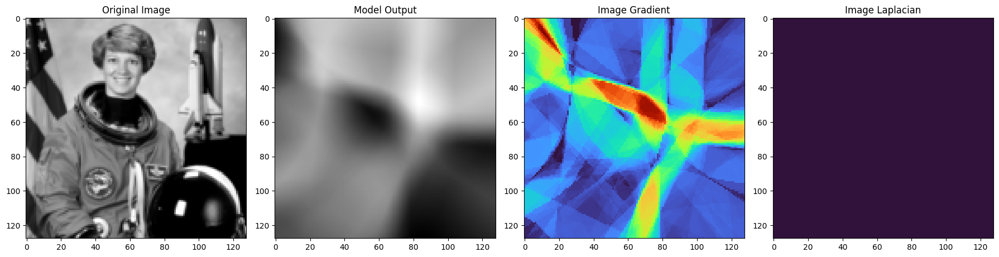

Step 800/2000: Loss = 0.13737215, PSNR = 8.6210


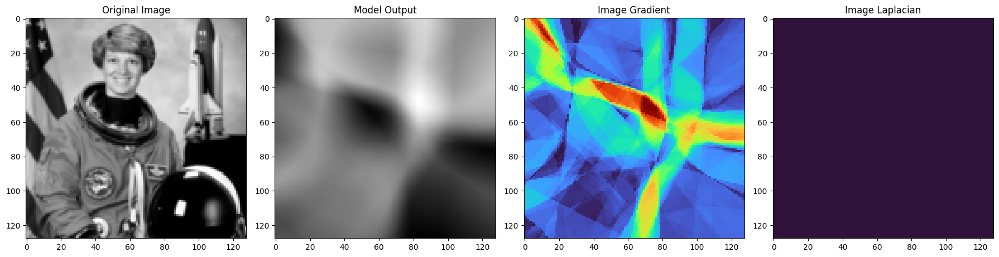

Step 900/2000: Loss = 0.13062203, PSNR = 8.8398


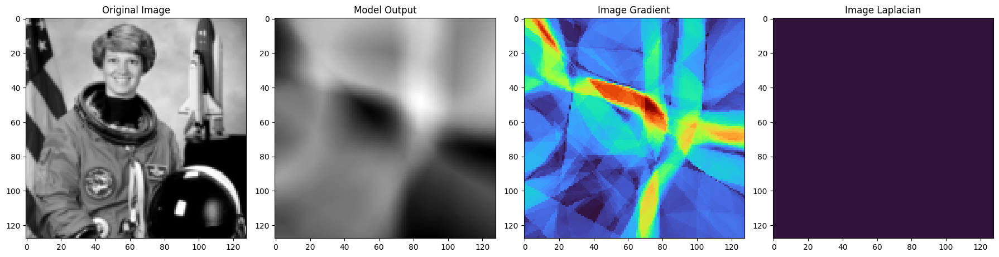

Step 1000/2000: Loss = 0.12495381, PSNR = 9.0325


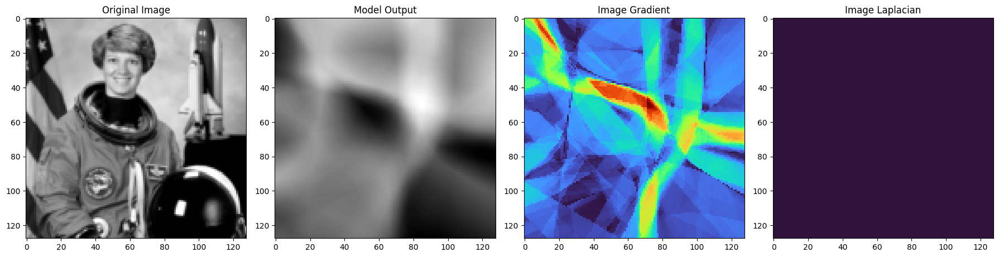

Step 1100/2000: Loss = 0.12023517, PSNR = 9.1997


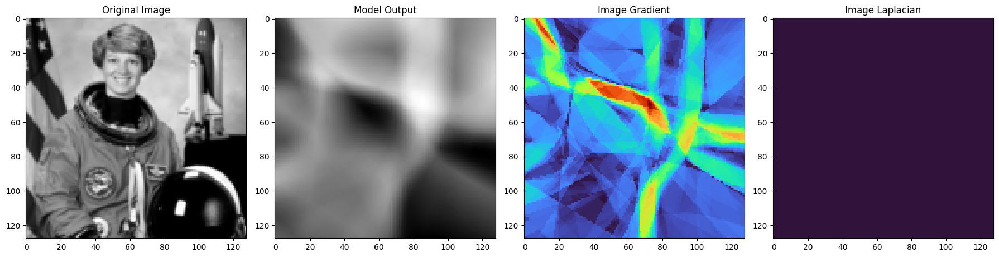

Step 1200/2000: Loss = 0.11603320, PSNR = 9.3542


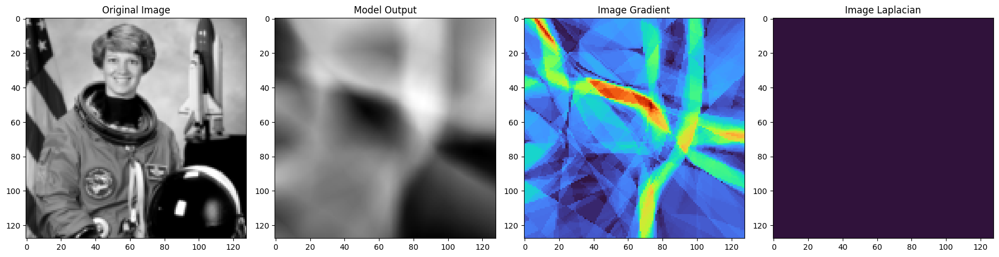

Step 1300/2000: Loss = 0.11214745, PSNR = 9.5021


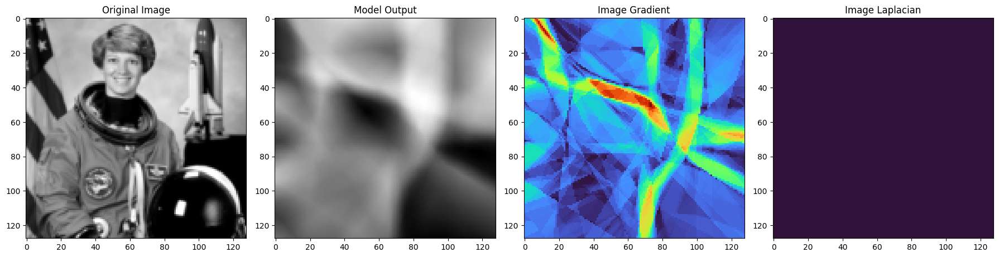

Step 1400/2000: Loss = 0.10846304, PSNR = 9.6472


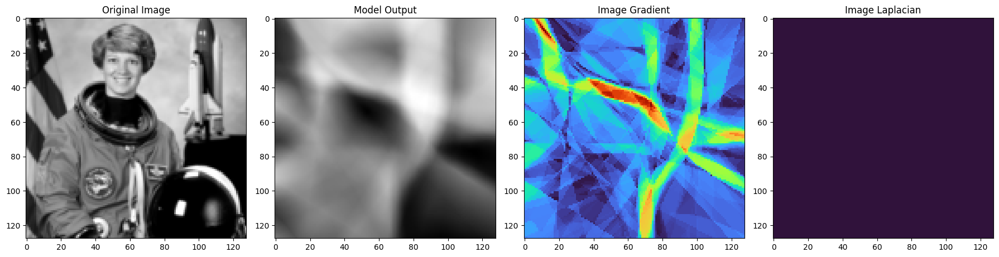

Step 1500/2000: Loss = 0.10497926, PSNR = 9.7890


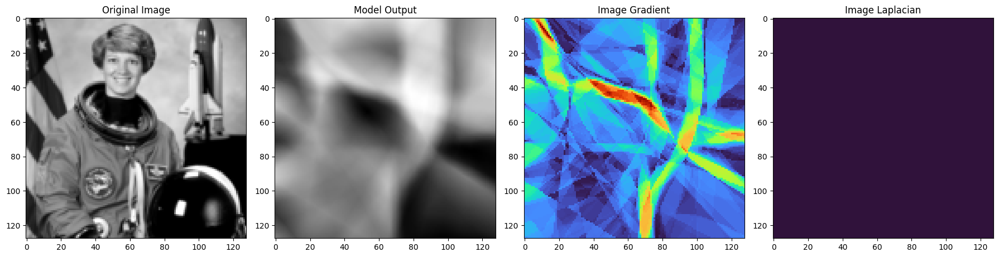

Step 1600/2000: Loss = 0.10165588, PSNR = 9.9287


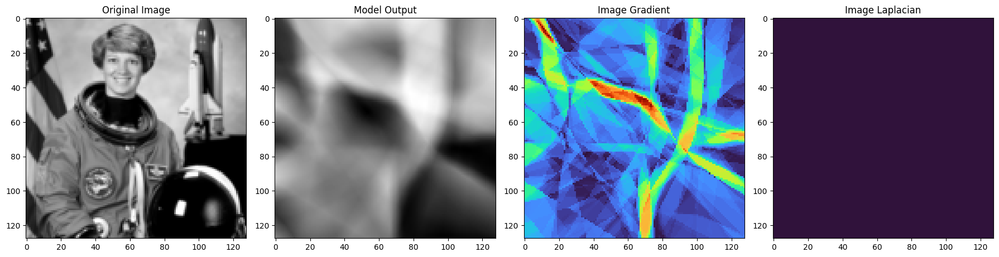

Step 1700/2000: Loss = 0.09865519, PSNR = 10.0588


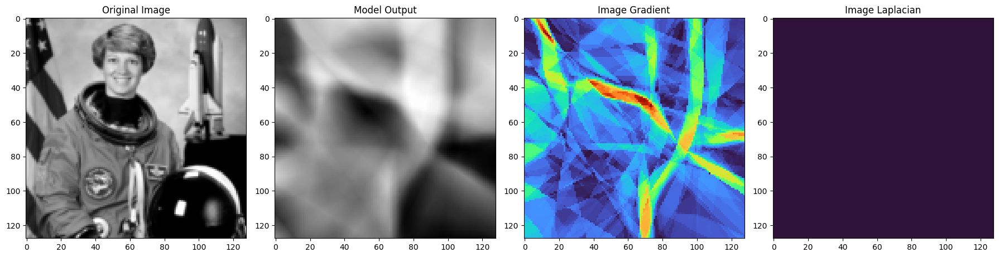

Step 1800/2000: Loss = 0.09583464, PSNR = 10.1848


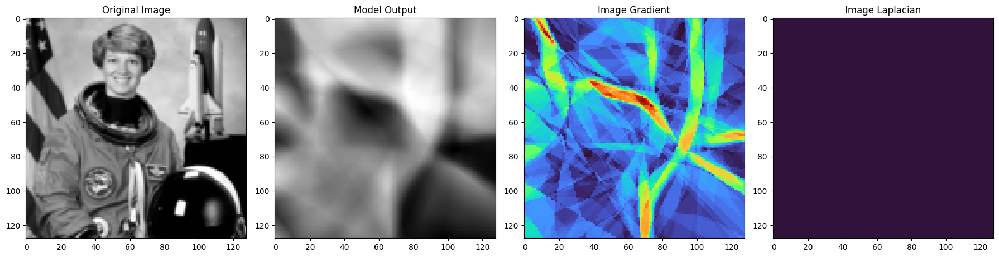

Step 1900/2000: Loss = 0.09313279, PSNR = 10.3090


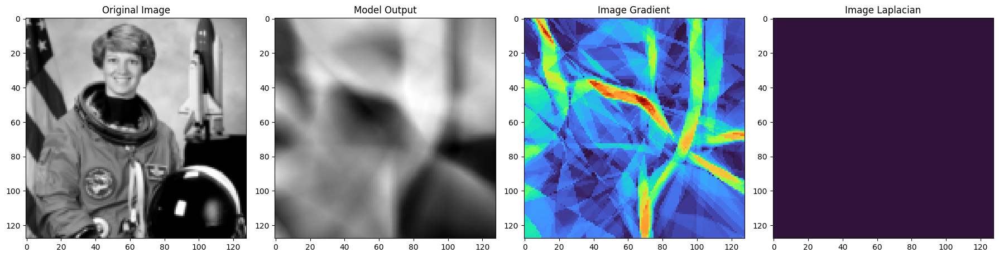

Step 2000/2000: Loss = 0.09054042, PSNR = 10.4316


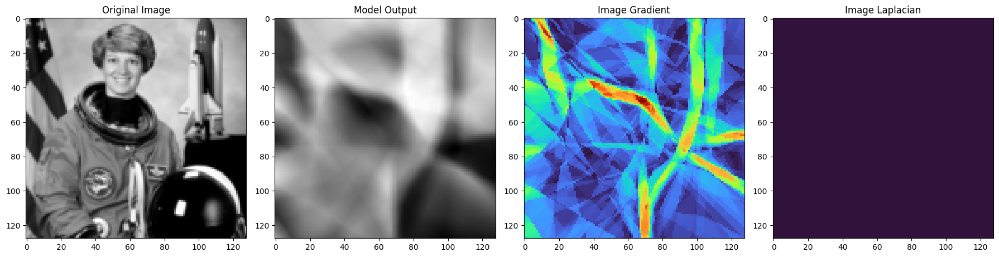

In [8]:
dataset = ImageDataset(height=128)

mlp_loss, mlp_psnr = train(
    model="MLP",
    dataset=dataset,
    lr=1e-4,
    total_steps=2000,
    steps_til_summary=100,
    device=device,
    **dict(
        in_features=2,
        out_features=1,
        hidden_features=128,
        hidden_layers=3,
        activation="ReLU",
    ),
)

Now fit the SIREN.

Step 1/2000: Loss = 0.58423042, PSNR = 2.3342


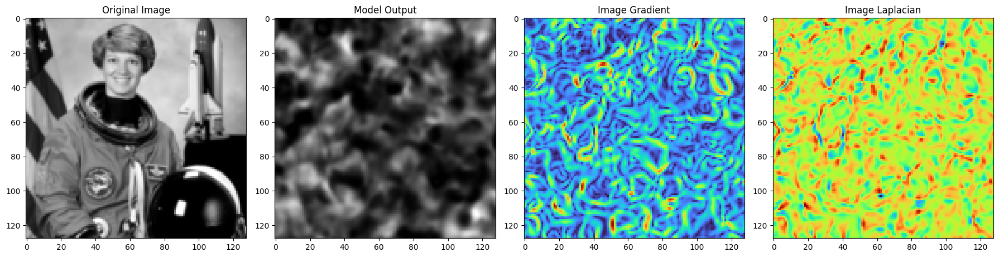

Step 200/2000: Loss = 0.00440482, PSNR = 23.5607


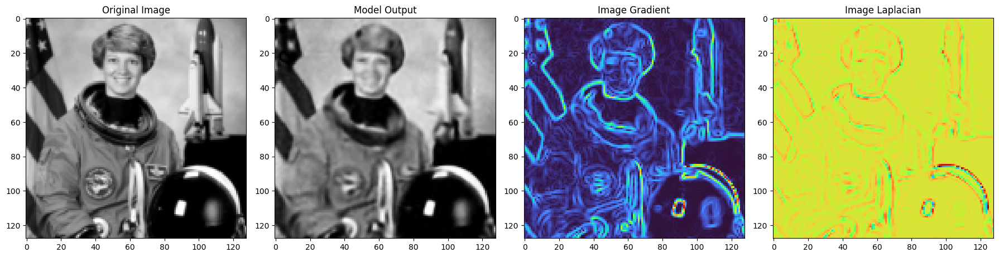

Step 400/2000: Loss = 0.00178708, PSNR = 27.4786


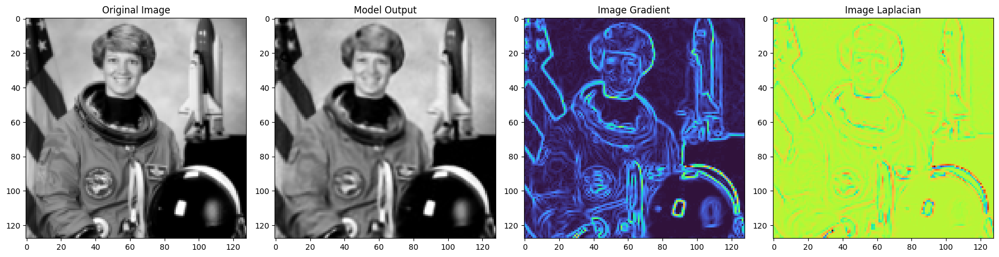

Step 600/2000: Loss = 0.00096874, PSNR = 30.1379


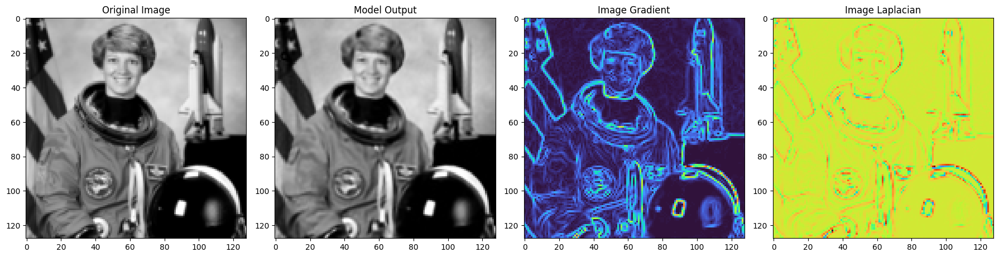

Step 800/2000: Loss = 0.00060029, PSNR = 32.2164


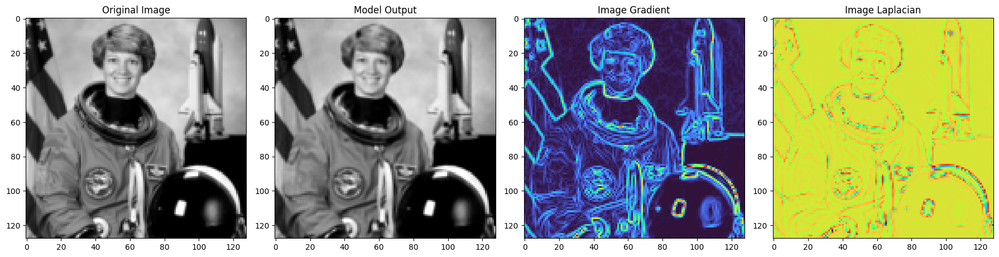

Step 1000/2000: Loss = 0.00052664, PSNR = 32.7849


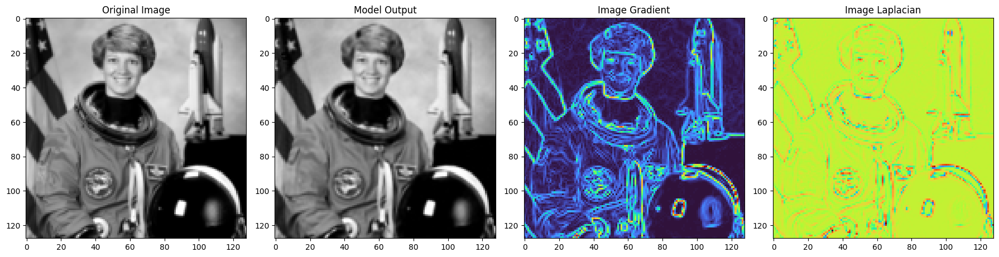

Step 1200/2000: Loss = 0.00031462, PSNR = 35.0221


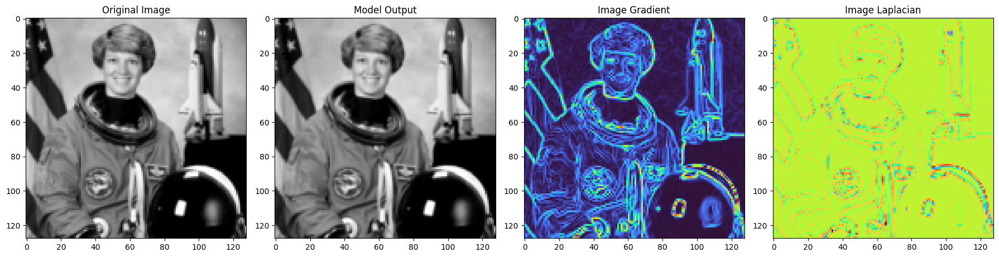

Step 1400/2000: Loss = 0.00018964, PSNR = 37.2208


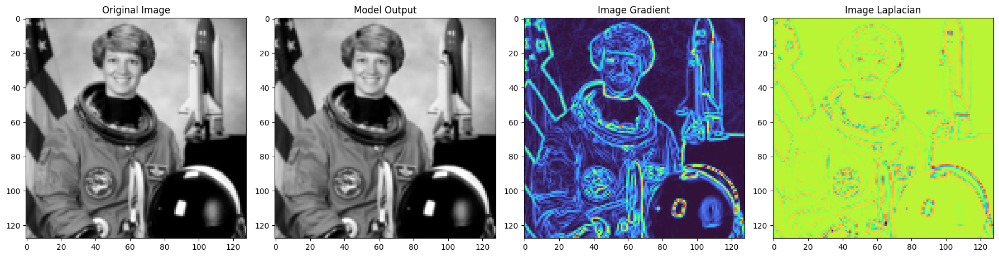

Step 1600/2000: Loss = 0.00013997, PSNR = 38.5397


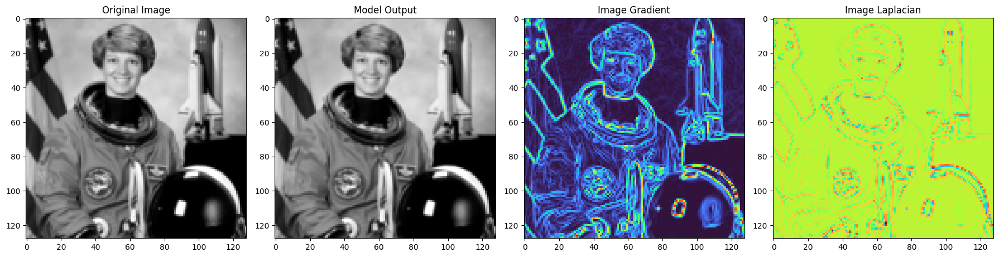

Step 1800/2000: Loss = 0.00010542, PSNR = 39.7709


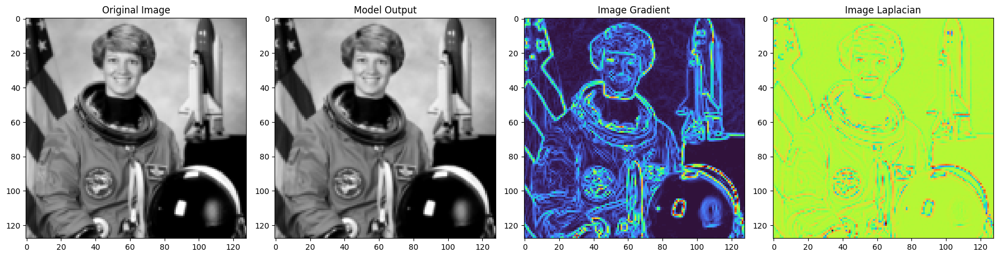

Step 2000/2000: Loss = 0.00007880, PSNR = 41.0345


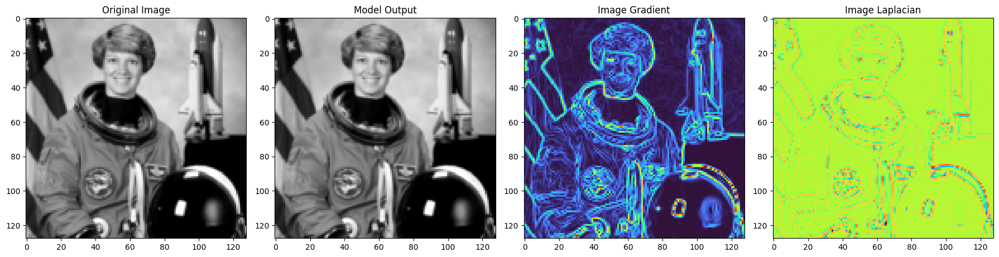

In [15]:
dataset = ImageDataset(height=128)

siren_loss, siren_psnr = train(
    model="SIREN",
    dataset=dataset,
    lr=1e-4,
    total_steps=2000,
    steps_til_summary=200,
    device=device,
    **dict(
        in_features=2,
        out_features=1,
        hidden_features=128,
        hidden_layers=10,
    ),
)

Compare the loss and PSNR for the two models.

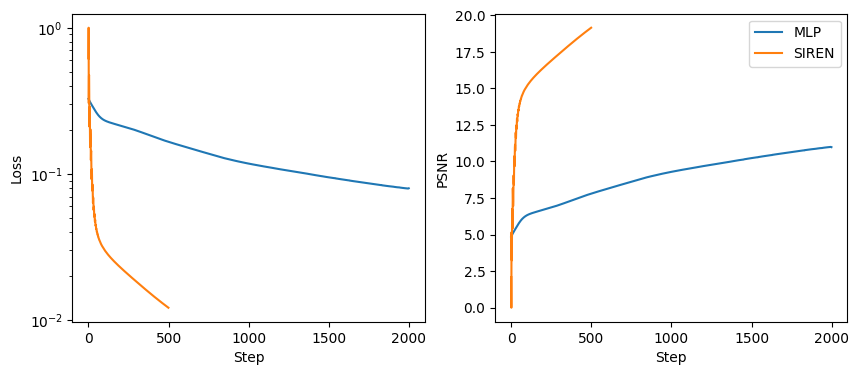

In [7]:
plt.figure(figsize=(10, 4))
plt.subplot(121)
plt.plot(mlp_loss, label="MLP")
plt.plot(siren_loss, label="SIREN")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.yscale("log")
plt.subplot(122)
plt.plot(mlp_psnr, label="MLP")
plt.plot(siren_psnr, label="SIREN")
plt.xlabel("Step")
plt.ylabel("PSNR")
plt.legend()
plt.show()

hidden_feature:  32 hidden_layer:  1
Step 1/2000: Loss = 0.36497173, PSNR = 4.3774


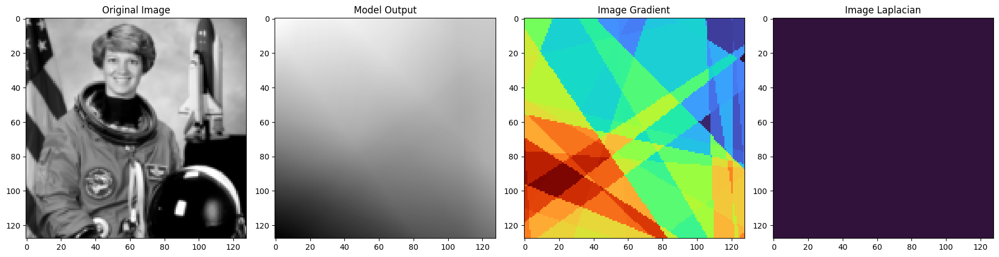

Step 2000/2000: Loss = 0.23085134, PSNR = 6.3667


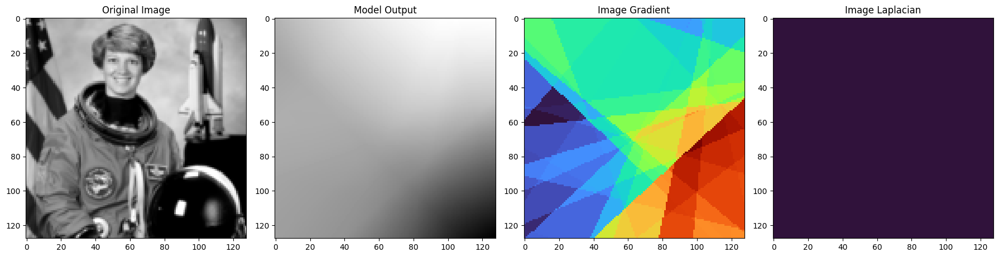

hidden_feature:  32 hidden_layer:  5
Step 1/2000: Loss = 0.32682881, PSNR = 4.8568


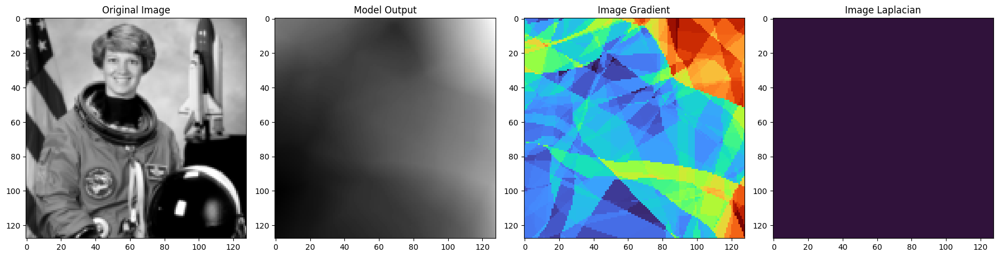

Step 2000/2000: Loss = 0.10917152, PSNR = 9.6189


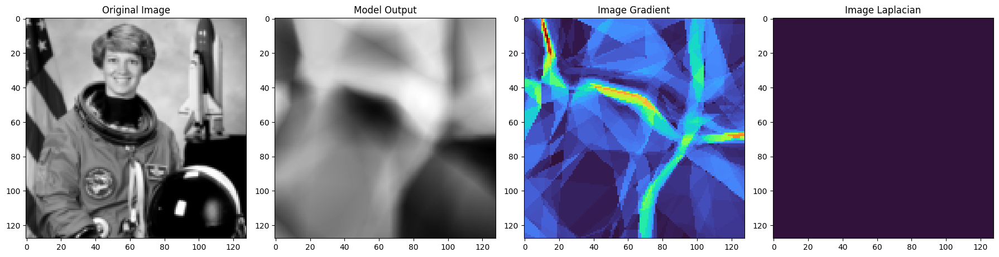

hidden_feature:  32 hidden_layer:  10
Step 1/2000: Loss = 0.33027929, PSNR = 4.8112


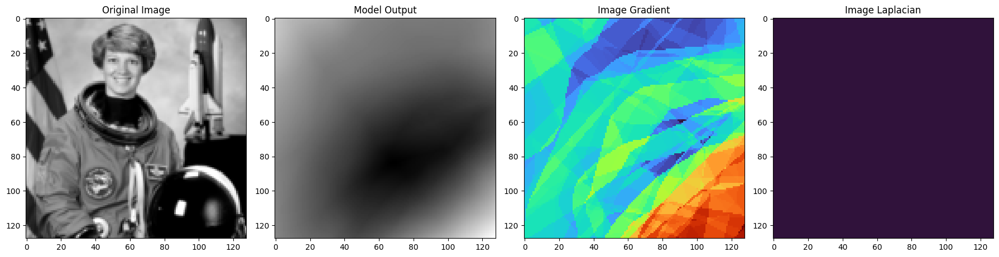

Step 2000/2000: Loss = 0.11464953, PSNR = 9.4063


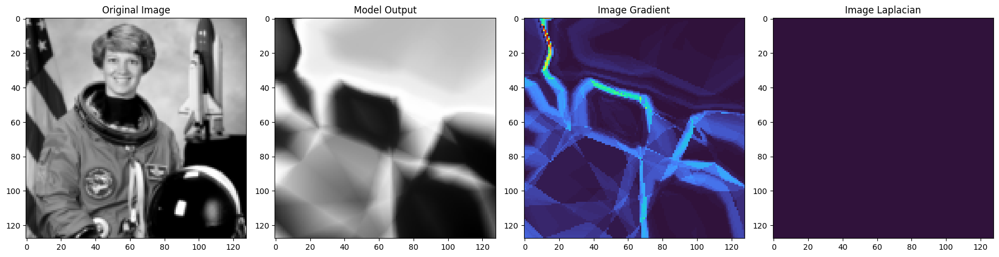

hidden_feature:  64 hidden_layer:  1
Step 1/2000: Loss = 0.41524619, PSNR = 3.8169


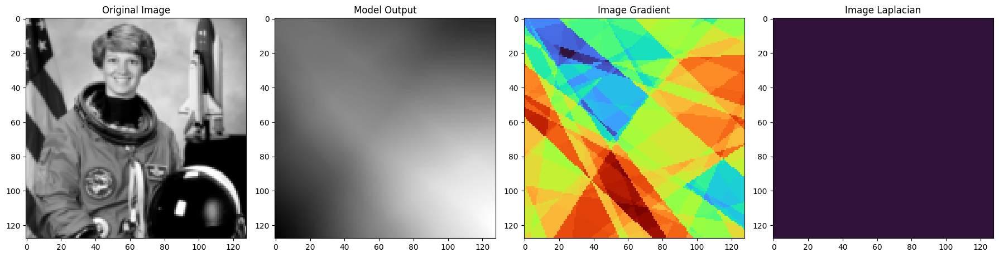

Step 2000/2000: Loss = 0.22638555, PSNR = 6.4515


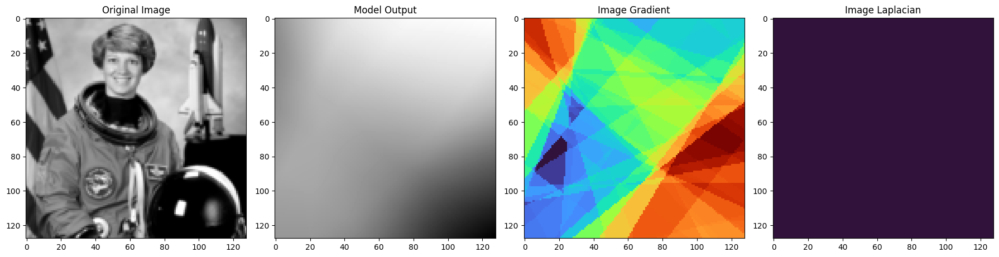

hidden_feature:  64 hidden_layer:  5
Step 1/2000: Loss = 0.33783156, PSNR = 4.7130


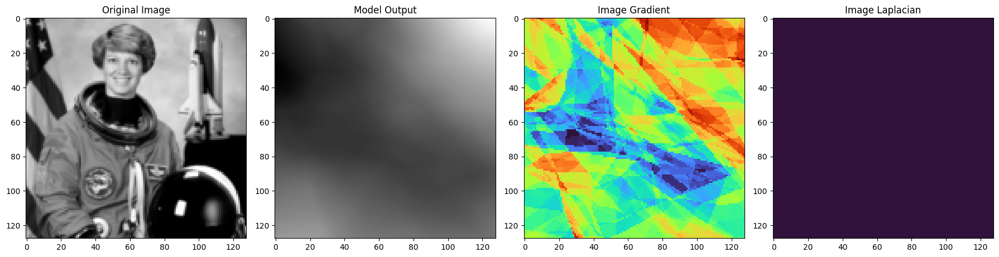

Step 2000/2000: Loss = 0.07060016, PSNR = 11.5119


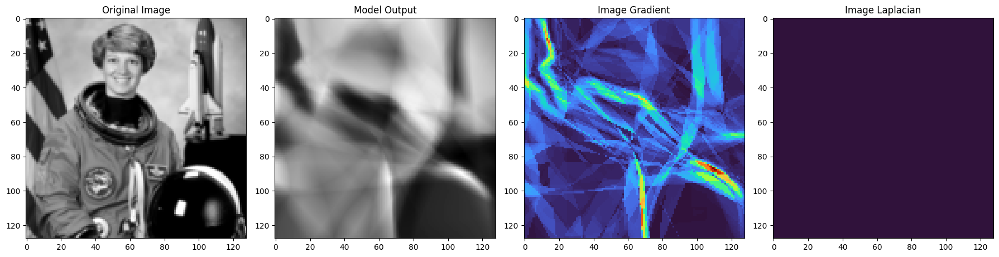

hidden_feature:  64 hidden_layer:  10
Step 1/2000: Loss = 0.33625636, PSNR = 4.7333


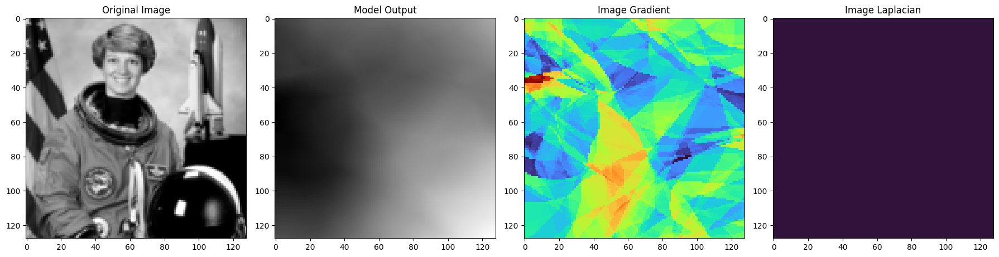

Step 2000/2000: Loss = 0.07326898, PSNR = 11.3508


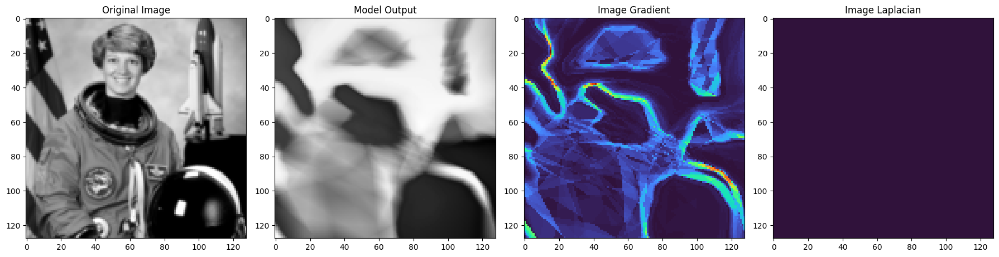

hidden_feature:  128 hidden_layer:  1
Step 1/2000: Loss = 0.29179242, PSNR = 5.3493


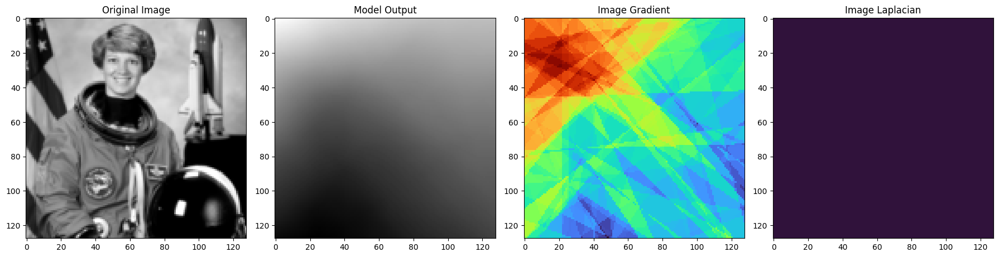

Step 2000/2000: Loss = 0.20807384, PSNR = 6.8178


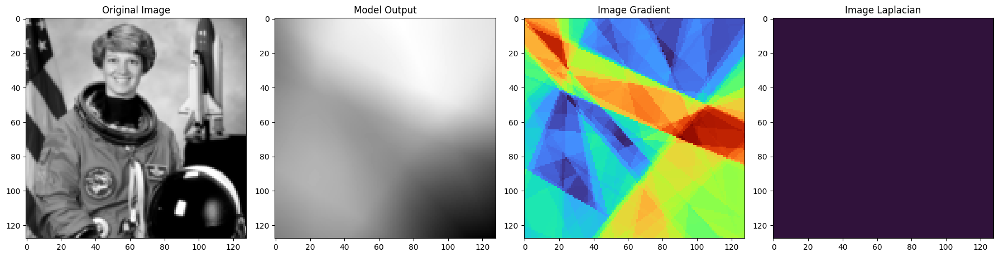

hidden_feature:  128 hidden_layer:  5
Step 1/2000: Loss = 0.32191172, PSNR = 4.9226


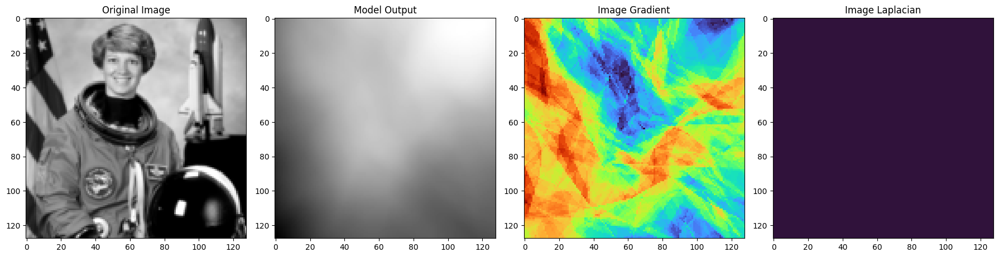

Step 2000/2000: Loss = 0.04801974, PSNR = 13.1858


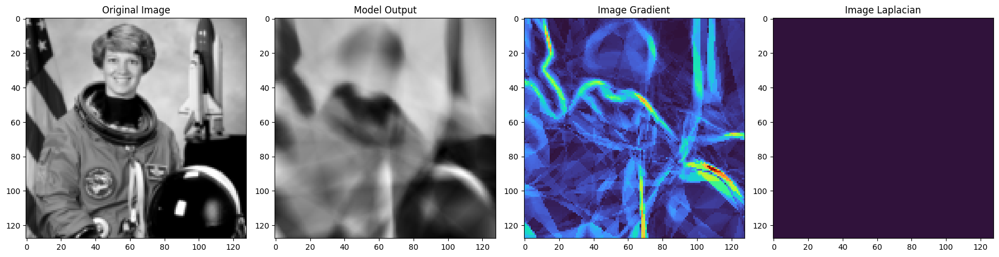

hidden_feature:  128 hidden_layer:  10
Step 1/2000: Loss = 0.32402217, PSNR = 4.8943


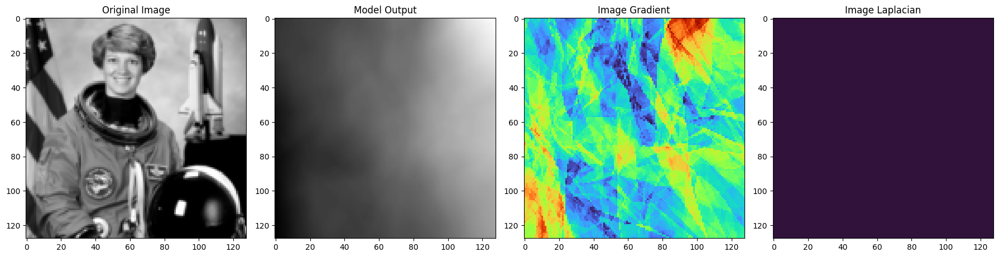

Step 2000/2000: Loss = 0.05133730, PSNR = 12.8957


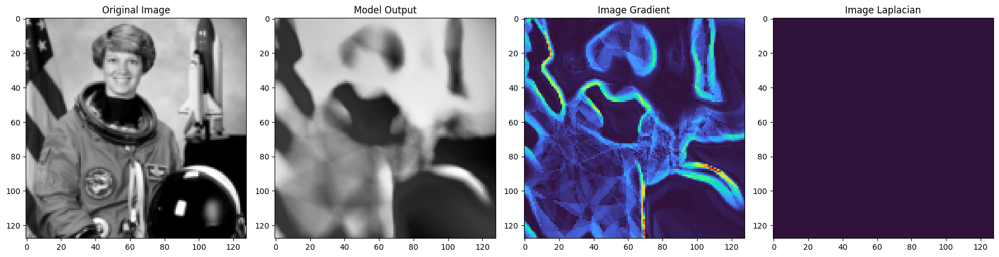

In [6]:
# benchmark 10 MLP models
dataset = ImageDataset(height=128)

hidden_features = [32, 64, 128]
hidden_layers = [1, 5, 10]


mlp_losses = {}
mlp_psnrs = {}
for hidden_feature in hidden_features:
    for hidden_layer in hidden_layers:
        print("hidden_feature: ", hidden_feature, "hidden_layer: ", hidden_layer)
        mlp_loss, mlp_psnr = train(
            model="MLP",
            dataset=dataset,
            lr=1e-4,
            total_steps=2000,
            steps_til_summary=2000,
            device=device,
            **dict(
                in_features=2,
                out_features=1,
                hidden_features=hidden_feature,
                hidden_layers=hidden_layer,
                activation="ReLU",
            ),
        )
        mlp_losses[(hidden_feature, hidden_layer)] = mlp_loss
        mlp_psnrs[(hidden_feature, hidden_layer)] = mlp_psnr



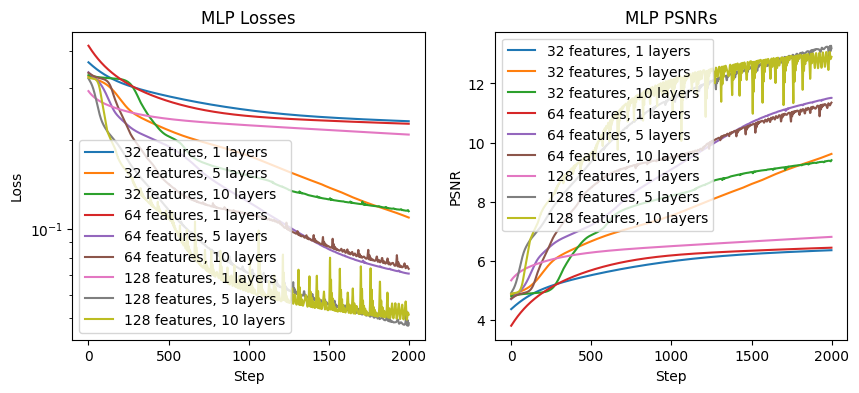

In [10]:
plt.figure(figsize=(10, 4))
plt.subplot(121)
for (hidden_feature, hidden_layer), loss in mlp_losses.items():
    plt.plot(loss, label=f"{hidden_feature} features, {hidden_layer} layers")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.yscale("log")
plt.legend()
plt.title("MLP Losses")
plt.subplot(122)
for (hidden_feature, hidden_layer), psnr in mlp_psnrs.items():
    plt.plot(psnr, label=f"{hidden_feature} features, {hidden_layer} layers")
plt.xlabel("Step")
plt.ylabel("PSNR")
plt.legend()
plt.title("MLP PSNRs")
plt.show() 

hidden_feature:  32 hidden_layer:  1
Step 1/2000: Loss = 0.83786345, PSNR = 0.7683


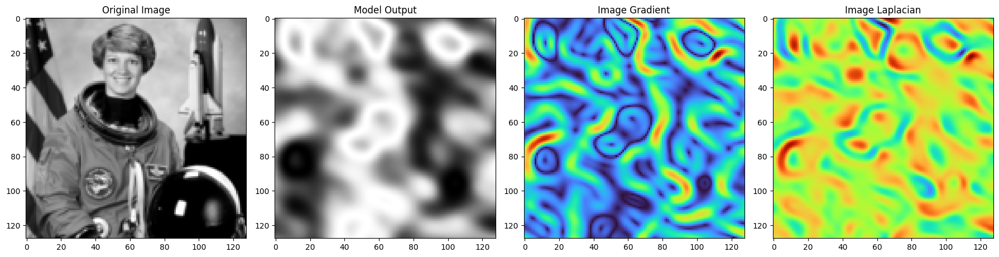

Step 2000/2000: Loss = 0.02823358, PSNR = 15.4923


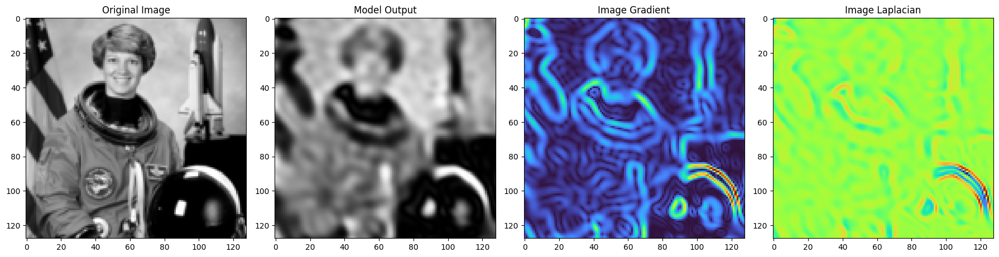

hidden_feature:  32 hidden_layer:  5
Step 1/2000: Loss = 1.42613673, PSNR = -1.5416


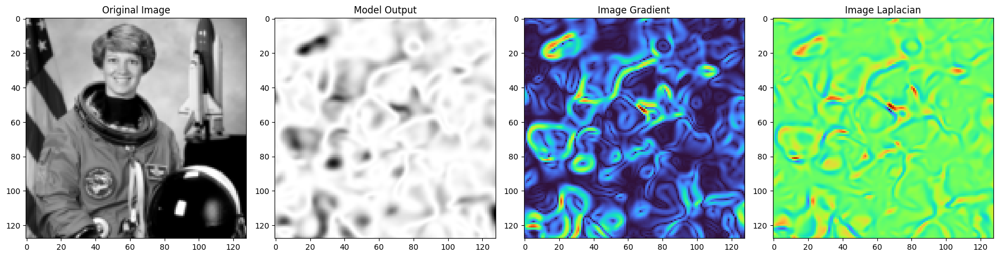

Step 2000/2000: Loss = 0.00515862, PSNR = 22.8747


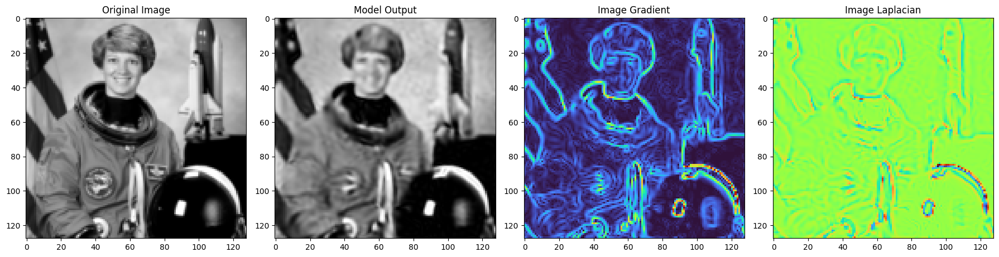

hidden_feature:  32 hidden_layer:  10
Step 1/2000: Loss = 1.29244900, PSNR = -1.1141


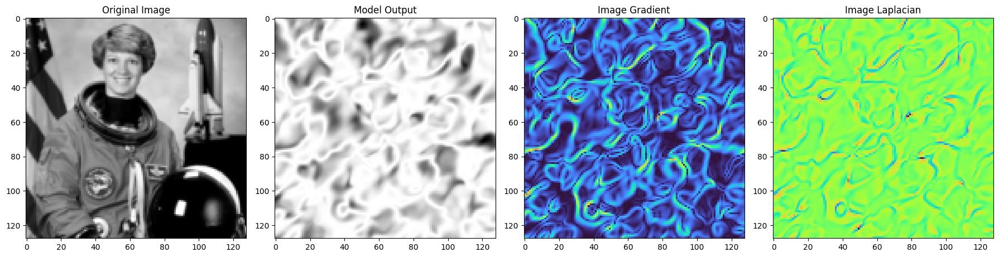

Step 2000/2000: Loss = 0.00279648, PSNR = 25.5339


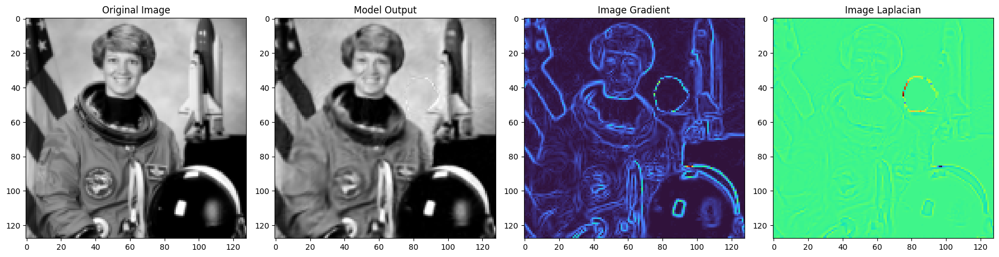

hidden_feature:  64 hidden_layer:  1
Step 1/2000: Loss = 0.66335630, PSNR = 1.7825


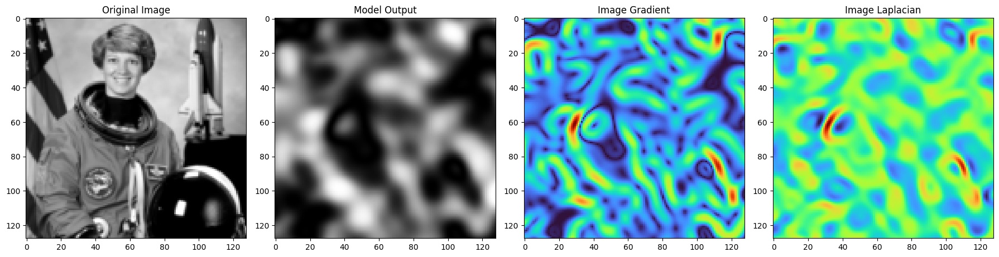

Step 2000/2000: Loss = 0.01677794, PSNR = 17.7526


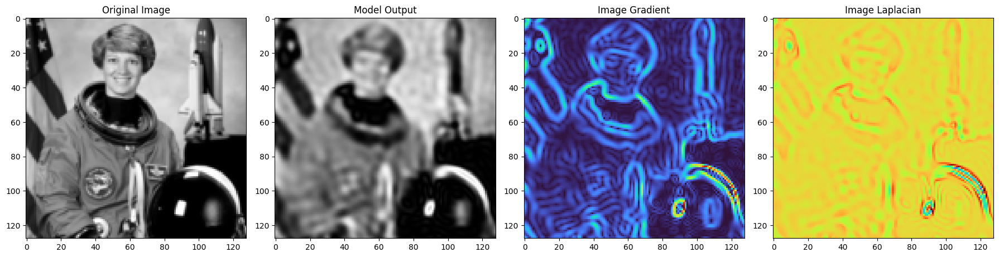

hidden_feature:  64 hidden_layer:  5
Step 1/2000: Loss = 0.61581188, PSNR = 2.1055


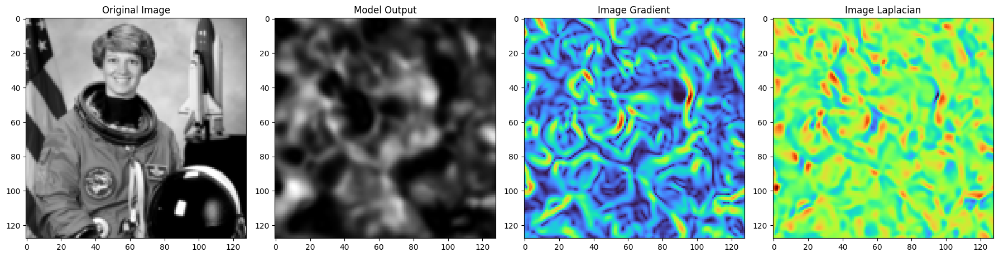

Step 2000/2000: Loss = 0.00116254, PSNR = 29.3459


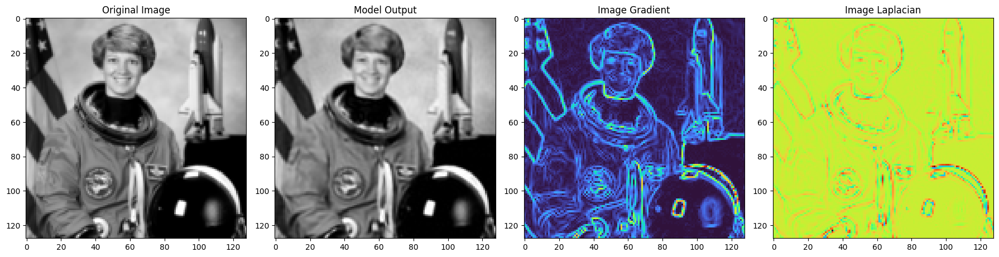

hidden_feature:  64 hidden_layer:  10
Step 1/2000: Loss = 1.40226316, PSNR = -1.4683


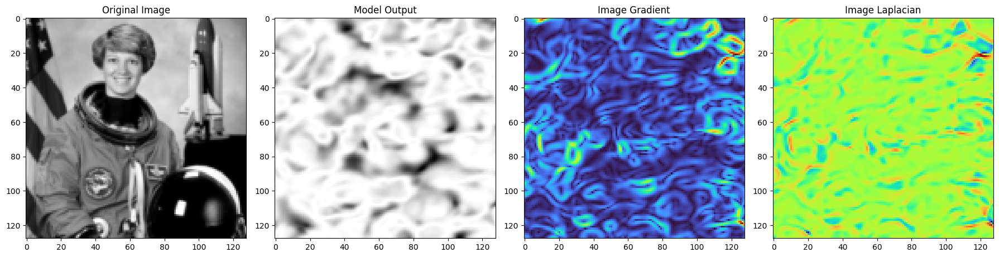

Step 2000/2000: Loss = 0.00101293, PSNR = 29.9442


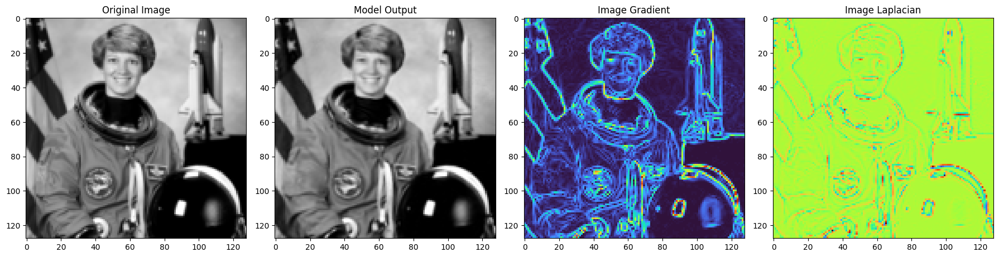

hidden_feature:  128 hidden_layer:  1
Step 1/2000: Loss = 0.65817451, PSNR = 1.8166


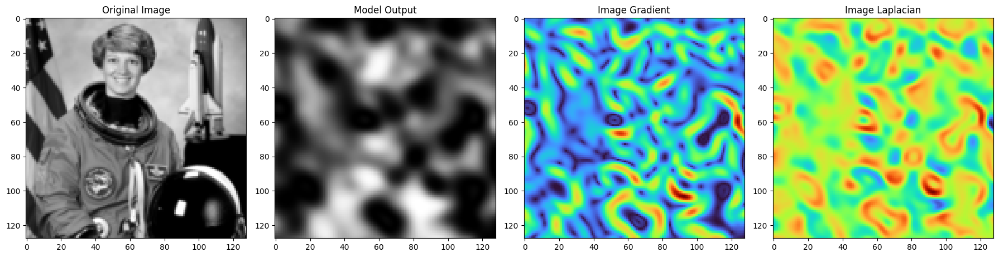

Step 2000/2000: Loss = 0.01095396, PSNR = 19.6043


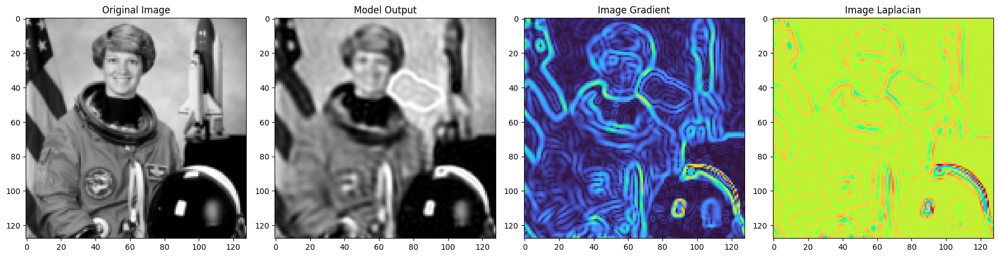

hidden_feature:  128 hidden_layer:  5
Step 1/2000: Loss = 1.26675451, PSNR = -1.0269


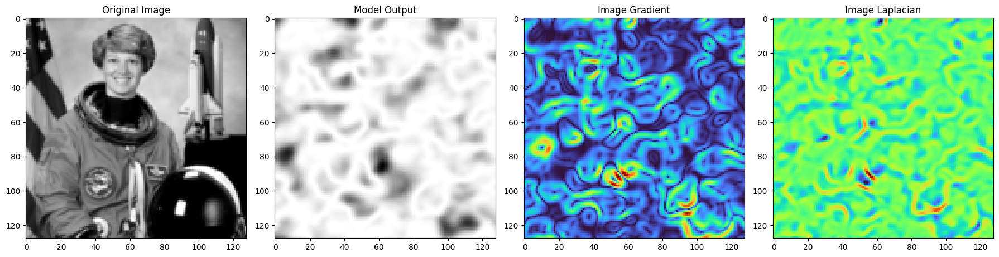

Step 2000/2000: Loss = 0.00091174, PSNR = 30.4013


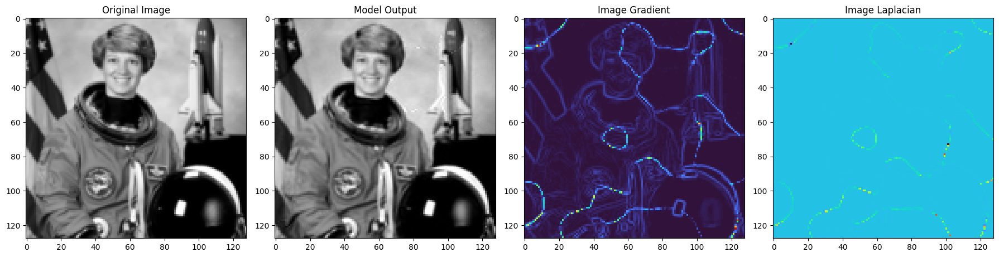

hidden_feature:  128 hidden_layer:  10
Step 1/2000: Loss = 1.14125919, PSNR = -0.5738


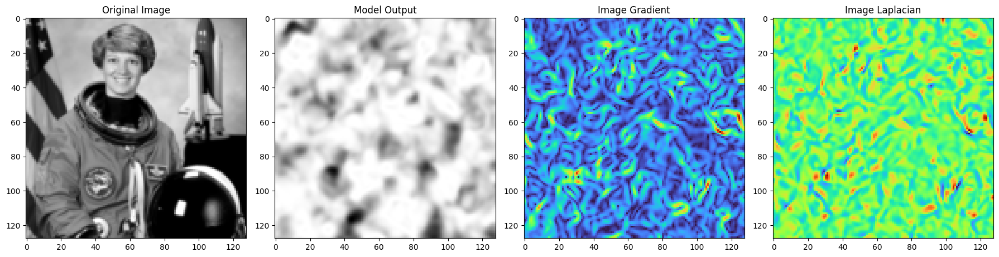

Step 2000/2000: Loss = 0.00012438, PSNR = 39.0525


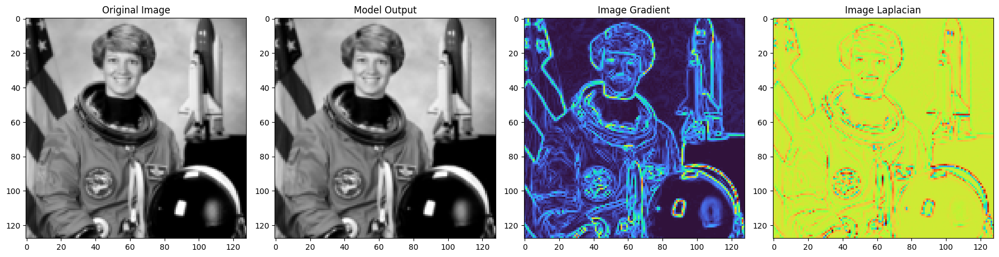

In [12]:
dataset = ImageDataset(height=128)

hidden_features = [32, 64, 128]
hidden_layers = [1, 5, 10]


SIREN_losses = {}
SIREN_psnrs = {}
for hidden_feature in hidden_features:
    for hidden_layer in hidden_layers:
        print("hidden_feature: ", hidden_feature, "hidden_layer: ", hidden_layer)
        SIREN_loss, SIREN_psnr = train(
            model="SIREN",
            dataset=dataset,
            lr=1e-4,
            total_steps=2000,
            steps_til_summary=2000,
            device=device,
            **dict(
                in_features=2,
                out_features=1,
                hidden_features=hidden_feature,
                hidden_layers=hidden_layer,
            ),
        )
        SIREN_losses[(hidden_feature, hidden_layer)] = SIREN_loss
        SIREN_psnrs[(hidden_feature, hidden_layer)] = SIREN_psnr

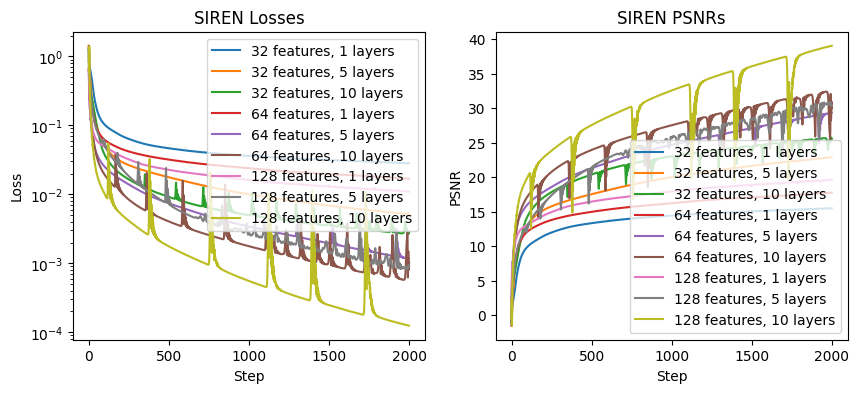

In [13]:
plt.figure(figsize=(10, 4))
plt.subplot(121)
for (hidden_feature, hidden_layer), loss in SIREN_losses.items():
    plt.plot(loss, label=f"{hidden_feature} features, {hidden_layer} layers")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.yscale("log")
plt.legend()
plt.title("SIREN Losses")
plt.subplot(122)
for (hidden_feature, hidden_layer), psnr in SIREN_psnrs.items():
    plt.plot(psnr, label=f"{hidden_feature} features, {hidden_layer} layers")
plt.xlabel("Step")
plt.ylabel("PSNR")
plt.legend()
plt.title("SIREN PSNRs")
plt.show() 